In [1]:
from eli5 import show_weights, explain_prediction
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pymorphy2 import MorphAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, classification_report
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from stop_words import get_stop_words
import lightgbm as lgb

from itertools import chain
import json
import os
import pickle
import string

PROJ_PATH = r'F:\tmp\data science\UnnParserBot'
CLASSES   = ['економіка', 'кримінал', 'культура', 'міжнародні новини',
             'позитив', 'політика', 'спорт', 'суспільство', 'технології']

c:\python3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
c:\python3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


In [58]:
# Preprocessing the data
morph = MorphAnalyzer(lang='uk')

def strip_punctuation(text):
    for char in chain(string.punctuation, ['“', '”', '„', '–', '—', '…']):
        text = text.replace(char, '')
    return text

def stemmed_text(text):
    return ' '.join([morph.parse(tok)[0].normal_form for tok in text.split(' ')])

STOP_WORDS = stemmed_text(' '.join(get_stop_words('ukrainian'))).split(' ')

with open(os.path.join(PROJ_PATH, 'src', 'categorized_news.json'), encoding='utf-8') as f:
    content       = json.load(f)
    article_names = []
    texts         = []
    headings      = []
    
    for id in content.keys():
        article_names.append(strip_punctuation(content[id]['name']))
        texts.append(strip_punctuation(content[id]['text']))
        headings.append(content[id]['category'])

len(article_names)

31000

In [59]:
# Encoding the target
le = LabelEncoder()
le.fit(CLASSES)
headings = le.transform(headings)

for class_, val in zip(np.unique(headings), le.inverse_transform(np.unique(headings))):
    print(f'{class_}: {val}')

0: економіка
1: кримінал
2: культура
3: міжнародні новини
4: позитив
5: політика
6: спорт
7: суспільство
8: технології


In [4]:
# word vectorizer object
tfidf_w = TfidfVectorizer(analyzer='word',        # token = word
                          sublinear_tf=True,
                          ngram_range=(1, 2),     # (1, 1) - only unigrams are used, (1,2) - unigrams/bigrams, etc.
                          stop_words=STOP_WORDS,  # list of words to filter or None
                          vocabulary=None,        # or dict - own_dictionary of words to process
                          max_df=0.8,             # a frequency limit to filter the words by
                          max_features=5000,      # only top N words will be used as columns,
                          smooth_idf=True,    
                          norm='l2'               # euclidean norm is used by default
                         )

In [5]:
# char vectorizer object
tfidf_ch = TfidfVectorizer(analyzer='char',        # token = word
                           ngram_range=(2, 6),     # (1, 1) - only unigrams are used, (1,2) - unigrams/bigrams, etc.
                           vocabulary=None,        # or dict - own_dictionary of words to process
                           max_df=0.8,             # a frequency limit to filter the words by
                           max_features=15000,     # only top N words will be used as columns,
                           smooth_idf=True,    
                           norm='l2'               # euclidean norm is used by default
                          )

In [6]:
# Splitting the texts into train/test folds
texts_train, texts_test = texts[:28000], texts[28000:]

In [7]:
%%time
# Apply TfidfVectorizers to the texts and build the dataset
def get_dataset(texts, vects, fit=False):
    """
    Fits/transforms the texts
    and returns the dataset based on the obtained features.
    """
    
    data = {}
    
    for vect in vects:
        if fit:
            vect.fit(texts)
        texts_transformed = vect.transform(texts)
        labels = [k for k,v in sorted(list(vect.vocabulary_.items()), key=lambda x: x[1])]
        data.update(zip(labels, texts_transformed.T.toarray()))
    
    return pd.DataFrame(data)
        
        
train_ds = get_dataset(texts_train, [tfidf_w, tfidf_ch], True)

# Resizing
train_ds = train_ds.astype('float16')

test_ds = get_dataset(texts_test, [tfidf_w, tfidf_ch])
test_ds = test_ds.astype('float16')
test_ds.head()

c:\python3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['дев', 'ятий', 'ятнадцятий', 'ятнадцять', 'ять', 'ім'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Wall time: 3min 45s


,000,05,10,10 млн,100,1000,101,102,11,11 січень,...,’є,’єд,’єдн,’єк,’єкт,’єр,’єрм,’єрмі,’єрмін,№
0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.020813,0.0,0.032074,0.0,0.0,0.0,0.036926,0.102051,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.013130,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.027512,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
all_ds = pd.concat([train_ds, test_ds])
all_ds.shape

(31000, 19579)

In [9]:
all_ds.dtypes

000       float16
05        float16
10        float16
10 млн    float16
100       float16
           ...   
’єр       float16
’єрм      float16
’єрмі     float16
’єрмін    float16
№         float16
Length: 19579, dtype: object

In [10]:
all_ds.to_csv(os.path.join(PROJ_PATH, 'src', 'dataset.csv'), index=False)

In [9]:
orig_features = all_ds.columns.tolist()

# Changing feature names as lgb doesn't support cyrillic chars
all_ds.rename({k:str(v) for k,v in zip(all_ds.columns, range(len(all_ds.columns)))}, axis=1, inplace=True)
train_ds, test_ds, y_train, y_test = train_test_split(all_ds,
                                                      headings,
                                                      test_size=0.2,
                                                      stratify=headings,
                                                      random_state=42)

(28000, 19579)

## LightGBM

In [2]:
%%time
# Loading the dataset, collecting the data
# Read the dataset
all_ds = pd.read_csv(os.path.join(PROJ_PATH, 'src', 'dataset.csv'))
orig_features = all_ds.columns.tolist()

with open(os.path.join(PROJ_PATH, 'src', 'categorized_news.json'), encoding='utf-8') as f:
    content  = json.load(f)
    headings = [content[id]['category'] for id in content.keys()]

# Encoding the target
le = LabelEncoder()
le.fit(list(set(headings)))
headings = le.transform(headings)

# Changing feature names as lgb doesn't support cyrillic chars
all_ds.rename({k:str(v) for k,v in zip(all_ds.columns, range(len(all_ds.columns)))}, axis=1, inplace=True)
train_ds, test_ds, y_train, y_test = train_test_split(all_ds,
                                                      headings,
                                                      test_size=0.2,
                                                      stratify=headings,
                                                      random_state=42)

Wall time: 4min 55s


In [3]:
# As lightgbm doesn't support f1-score metric out of the box, creating our own evaluation function
# based on sklearn f1-score
def my_fscore(y_hat, data):
    y_true = data.get_label()
    
    # y_hat is the preds grouped by class_id first, then group by row_id.
    # len(y_true)*parameters['num_class'] records in total
    # here we gathering predicted class for each target record
    y_pred = [np.argmax(y_hat[i::len(y_true)]) for i in range(len(y_true))]
    
    # Using weighted-F1 scoring:
    # https://towardsdatascience.com/multi-class-metrics-made-simple-part-ii-the-f1-score-ebe8b2c2ca1
    return 'f1 score', f1_score(y_true, y_pred, average='weighted'), True

In [10]:
# Optimizing parameters on cross validation
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

parameters = {
    #default
    "objective"    : "multiclass",
    "num_class"    : 9,
    "learning_rate": 0.01,
    "num_threads"  : os.cpu_count() - 2,
    "seed"         : 42,
    
    #regularization
    "feature_fraction": 0.9,
    "bagging_fraction": 0.9,
    "bagging_freq"    : 1,
    "min_data_in_leaf": 50,
    "num_leaves"      : 5
}

lgb_train = lgb.Dataset(train_ds, label=y_train, free_raw_data=False)

result = lgb.cv(parameters, lgb_train, 1000, folds=skf, early_stopping_rounds=10, verbose_eval=50, eval_train_metric=True)

[50]	cv_agg's train multi_logloss: 0.999098 + 0.00209513	cv_agg's valid multi_logloss: 1.02886 + 0.00541116
[100]	cv_agg's train multi_logloss: 0.793149 + 0.00210823	cv_agg's valid multi_logloss: 0.836441 + 0.00540159
[150]	cv_agg's train multi_logloss: 0.686186 + 0.00138449	cv_agg's valid multi_logloss: 0.741109 + 0.00496247
[200]	cv_agg's train multi_logloss: 0.618632 + 0.000707361	cv_agg's valid multi_logloss: 0.683852 + 0.00407916
[250]	cv_agg's train multi_logloss: 0.571068 + 0.00014267	cv_agg's valid multi_logloss: 0.645659 + 0.00346298
[300]	cv_agg's train multi_logloss: 0.534965 + 0.000356031	cv_agg's valid multi_logloss: 0.61851 + 0.00289071
[350]	cv_agg's train multi_logloss: 0.506343 + 0.000513663	cv_agg's valid multi_logloss: 0.59914 + 0.00249029
[400]	cv_agg's train multi_logloss: 0.482543 + 0.000545063	cv_agg's valid multi_logloss: 0.584742 + 0.00215978
[450]	cv_agg's train multi_logloss: 0.462156 + 0.000594951	cv_agg's valid multi_logloss: 0.57353 + 0.00206431
[500]	cv_a

In [4]:
# Training the model
parameters = {
    #default
    "objective"    : "multiclass",
    "num_class"    : 9,
    "learning_rate": 0.01,
    "num_threads"  : os.cpu_count() - 2,
    "seed"         : 42,
    
    #regularization
    "feature_fraction": 0.9,
    "bagging_fraction": 0.9,
    "bagging_freq"    : 1,
    "min_data_in_leaf": 50,
    "num_leaves"      : 5
}

lgb_train = lgb.Dataset(train_ds, label=y_train, free_raw_data=False)

gbm = lgb.train(parameters, lgb_train,
                num_boost_round       = 1000,
                feval                 = my_fscore
               )

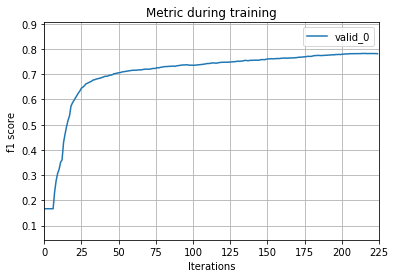

In [8]:
# Plotting the metric results
lgb.plot_metric(evals_result, metric='f1 score')
plt.show()

In [5]:
# Predicting on test dataset
predictions = gbm.predict(test_ds)
print(classification_report(y_test, [np.argmax(i) for i in predictions], target_names=CLASSES))

                   precision    recall  f1-score   support

        економіка       0.77      0.59      0.67       522
         кримінал       0.83      0.86      0.85      1319
         культура       0.50      0.07      0.12        14
міжнародні новини       0.78      0.81      0.79       881
          позитив       0.00      0.00      0.00        16
         політика       0.77      0.88      0.82      2075
            спорт       0.96      0.98      0.97       451
      суспільство       0.73      0.55      0.63       913
       технології       0.00      0.00      0.00         9

         accuracy                           0.79      6200
        macro avg       0.59      0.53      0.54      6200
     weighted avg       0.79      0.79      0.79      6200



c:\python3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [6]:
def get_prediction_stats(target_test, target_pred=None):
    """
    Prints a map <column_name> -> number of samples.
    If target_pred is provided also gives (<right_predictions>/total) stats.
    """
    
    if target_pred is None:
        print(pd.Series(le.inverse_transform(target_test)).value_counts().sort_index())
    else:
        unique_columns = target_test.unique()
        for column in unique_columns:
            c_pred          = len([y for y, yy in zip(target_test, target_pred) if y == column == yy])
            value_counts    = target_test.value_counts()[column]
            percentage      = (c_pred/value_counts)*100
            max_feature_len = max([len(f) for f in le.inverse_transform(unique_columns)])
            print(f'{le.inverse_transform([column])[0]:17s}: {value_counts:5d}, correctly predicted {c_pred:4d} ({percentage:.3f}%)')

In [8]:
get_prediction_stats(headings)

економіка             2610
кримінал              6596
культура                70
міжнародні новини     4406
позитив                 79
політика             10377
спорт                 2256
суспільство           4563
технології              43
dtype: int64


In [9]:
get_prediction_stats(pd.Series(y_test), target_pred=[np.argmax(i) for i in predictions])

міжнародні новини:   881, correctly predicted  711 (80.704%)
кримінал         :  1319, correctly predicted 1132 (85.823%)
суспільство      :   913, correctly predicted  500 (54.765%)
політика         :  2075, correctly predicted 1831 (88.241%)
спорт            :   451, correctly predicted  441 (97.783%)
економіка        :   522, correctly predicted  306 (58.621%)
культура         :    14, correctly predicted    1 (7.143%)
позитив          :    16, correctly predicted    0 (0.000%)
технології       :     9, correctly predicted    0 (0.000%)


In [34]:
# Oops
explain_prediction(gbm, train_ds.iloc[1])

Explanation(estimator='<lightgbm.basic.Booster object at 0x0000028F50D010C8>', description=None, error='estimator <lightgbm.basic.Booster object at 0x0000028F50D010C8> is not supported', method=None, is_regression=False, targets=None, feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [29]:
# Saving the model
model_json = gbm.dump_model()

with open(os.path.join(PROJ_PATH, 'src', 'class_model_lgbm.json'), 'w', encoding='utf-8') as f:
    json.dump(model_json, f, indent=4)

## LogisticRegression

In [3]:
# Training the model
classifier = LogisticRegression(solver='saga')
log_reg    = classifier.fit(train_ds, y_train)

In [4]:
# Predicting
log_predictions = log_reg.predict(test_ds)

In [5]:
# Evaluating with f1 weighted score (words & chars)
print(f'Accuracy: {f1_score(y_test, log_predictions, average="weighted")}')
print(f'Train accuracy: {f1_score(y_train, log_reg.predict(train_ds), average="weighted")}')

Accuracy: 0.8209965483083526
Train accuracy: 0.8867675957846208


In [6]:
# Evaluating with f1 macro score (words & chars)
print(f'Accuracy: {f1_score(y_test, log_predictions, average="macro")}')
print(f'Train accuracy: {f1_score(y_train, log_reg.predict(train_ds), average="macro")}')

Accuracy: 0.5511550138915956
Train accuracy: 0.6690084687553698


In [7]:
print(classification_report(y_test, log_predictions, zero_division=True, target_names=CLASSES))

                   precision    recall  f1-score   support

        економіка       0.79      0.69      0.74       392
         кримінал       0.86      0.87      0.86       989
         культура       0.00      0.00      0.00        11
міжнародні новини       0.82      0.86      0.84       661
          позитив       1.00      0.00      0.00        12
         політика       0.81      0.88      0.84      1557
            спорт       0.99      0.98      0.98       338
      суспільство       0.75      0.64      0.69       684
       технології       1.00      0.00      0.00         6

         accuracy                           0.83      4650
        macro avg       0.78      0.55      0.55      4650
     weighted avg       0.82      0.83      0.82      4650



In [10]:
get_prediction_stats(pd.Series(y_test), target_pred=log_predictions)

політика         :  1557, correctly predicted 1367 (87.797%)
міжнародні новини:   661, correctly predicted  571 (86.384%)
суспільство      :   684, correctly predicted  437 (63.889%)
кримінал         :   989, correctly predicted  862 (87.159%)
спорт            :   338, correctly predicted  332 (98.225%)
економіка        :   392, correctly predicted  271 (69.133%)
позитив          :    12, correctly predicted    0 (0.000%)
технології       :     6, correctly predicted    0 (0.000%)
культура         :    11, correctly predicted    0 (0.000%)


In [11]:
show_weights(log_reg, 
             target_names=CLASSES,
             feature_names=orig_features)

In [12]:
explain_prediction(log_reg,
                   train_ds.iloc[1],
                   target_names=CLASSES,
                   feature_names=orig_features)

Explanation(estimator="LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,\n                   intercept_scaling=1, l1_ratio=None, max_iter=100,\n                   multi_class='auto', n_jobs=None, penalty='l2',\n                   random_state=None, solver='saga', tol=0.0001, verbose=0,\n                   warm_start=False)", description=None, error=None, method='linear model', is_regression=False, targets=[TargetExplanation(target='економіка', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='<BIAS>', weight=0.6706794220911039, std=None, value=1.0), FeatureWeight(feature='вказано', weight=0.06542382293872022, std=None, value=0.05582), FeatureWeight(feature='повідомляти посилання', weight=0.04689066521877012, std=None, value=0.0498), FeatureWeight(feature='поточний', weight=0.03475677038710814, std=None, value=0.05786), FeatureWeight(feature='унн повідомляти', weight=0.03195833145494932, std=None, value=0.0486), FeatureWeight(feature='український', weight=0.03151748022128683, std=None, value=0.07135), FeatureWeight(feature='анк', weight=0.025815340438735093, std=None, value=0.03067), FeatureWeight(feature='вказати', weight=0.021054303147722803, std=None, value=0.053739999999999996), FeatureWeight(feature='нк', weight=0.02061344394537324, std=None, value=0.03638), FeatureWeight(feature='бс', weight=0.018771234860032692, std=None, value=0.0635), FeatureWeight(feature='ожи', weight=0.01854996368391884, std=None, value=0.0397), FeatureWeight(feature='населений', weight=0.018311233436969727, std=None, value=0.1412), FeatureWeight(feature='пять', weight=0.01751446404443184, std=None, value=0.07477), FeatureWeight(feature='зокрема', weight=0.016468866019650332, std=None, value=0.0425), FeatureWeight(feature='домовленість', weight=0.016107681846036916, std=None, value=0.0656), FeatureWeight(feature='позиція', weight=0.014748849998171458, std=None, value=0.05392), FeatureWeight(feature='укр', weight=0.01359017223942835, std=None, value=0.01517), FeatureWeight(feature='ет ', weight=0.01306797396365001, std=None, value=0.0455), FeatureWeight(feature=' об', weight=0.012767727356309983, std=None, value=0.05057), FeatureWeight(feature='вка', weight=0.01254202001014802, std=None, value=0.035), FeatureWeight(feature='кт', weight=0.011916902764466445, std=None, value=0.028980000000000002), FeatureWeight(feature='кт ', weight=0.011861689821605298, std=None, value=0.023819999999999997), FeatureWeight(feature='доб', weight=0.011707641134016192, std=None, value=0.03354), FeatureWeight(feature='ивн', weight=0.0115878604016866, std=None, value=0.0434), FeatureWeight(feature=' укр', weight=0.011561707785555249, std=None, value=0.015205000000000002), FeatureWeight(feature='ий обс', weight=0.01131008928527563, std=None, value=0.047330000000000004), FeatureWeight(feature='ук', weight=0.010938050919284318, std=None, value=0.01403), FeatureWeight(feature='й обс', weight=0.010548797429007226, std=None, value=0.04645), FeatureWeight(feature='рож', weight=0.010515817896275264, std=None, value=0.03476), FeatureWeight(feature='вк', weight=0.010459877546263738, std=None, value=0.030789999999999998), FeatureWeight(feature='зазначається', weight=0.010415830911480066, std=None, value=0.0492), FeatureWeight(feature='ункт', weight=0.009875792258906876, std=None, value=0.0446), FeatureWeight(feature='пункт', weight=0.009875792258906876, std=None, value=0.0446), FeatureWeight(feature='пунк', weight=0.009875792258906876, std=None, value=0.0446), FeatureWeight(feature=' ук', weight=0.00981266202132314, std=None, value=0.015075999999999999), FeatureWeight(feature='пункт ', weight=0.009624255785165606, std=None, value=0.0461), FeatureWeight(feature='ункт ', weight=0.009624255785165606, std=None, value=0.0461), FeatureWeight(feature='нкт ', weight=0.009618874325800896, std=None, value=0.0461), FeatureWeight(feature='орож', weight=0.009592060658855405, std=None, value=0.0424), FeatureWeight(feature='пун', weight=0.009544411368908318, std=N

In [44]:
# Saving the model
# sklearn models are not JSON serializable unfortunately
with open(os.path.join(PROJ_PATH, 'src', 'class_model_log.md'), 'wb') as f:
    pickle.dump(log_reg, f)